# 31 — VLM direct generation: gallery

Plan `quirky-growing-wombat` (2026-09-08). Inputs are the collaborator's preview pictures
(notebooks 07/08), assembled into contact sheets by `vg_prepare.py`; outputs are whatever the model
returned (`vg_generate.py` on tinkercliffs), collected by `vg_collect.py`. **No evaluation here.**

In [1]:
import json, pandas as pd, matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image
import vg_lib as vg
P = pd.read_csv(vg.PROMPTS_CSV)
G = pd.read_csv(vg.VG / "vg_generated_index.csv") if (vg.VG / "vg_generated_index.csv").exists() else pd.DataFrame()
print(len(P), "prompts;", len(G), "generated outputs" if len(G) else "generated outputs (none yet)")
if len(G): print(G.groupby(["model","layout","sensor","arm","band","target"]).ok.sum().to_string())

216 prompts; 0 generated outputs (none yet)


## 1. One full prompt per arm (band text on), as sent

In [2]:
J = {json.loads(l)["prompt_id"]: json.loads(l) for l in open(vg.PROMPTS_JSONL)}
for pid in ("s2_treatment_0001_shc_P11_band1", "s2_treatment_0001_scm_P11_band1"):
    print("=====", pid, "(persite layout) =====\n" + J[pid]["prompt_persite"] + "\n")

===== s2_treatment_0001_shc_P11_band1 (persite layout) =====
You are given 10 pictures of one land parcel, one picture per month, in time order:
P01 = 2023-11, P02 = 2023-12, P03 = 2024-01, P04 = 2024-02, P05 = 2024-03, P06 = 2024-04, P07 = 2024-05, P08 = 2024-06, P09 = 2024-07, P10 = 2024-08.
Each picture is a Sentinel-2 optical satellite image of a land parcel about 1 km across, shown in natural colour (red, green, blue bands). Black pixels are cloud-masked, no data.
Mean band values of each picture (reflectance 0-1 for B2 B3 B4 B8 B11 B12, plus NDVI and NDWI):
TARGET P01: B2 0.029, B3 0.045, B4 0.051, B8 0.235, B11 0.214, B12 0.125, NDVI 0.629, NDWI -0.677
TARGET P02: B2 0.028, B3 0.045, B4 0.056, B8 0.191, B11 0.183, B12 0.114, NDVI 0.546, NDWI -0.636
TARGET P03: B2 0.098, B3 0.112, B4 0.126, B8 0.245, B11 0.121, B12 0.081, NDVI 0.376, NDWI -0.447
TARGET P04: B2 0.036, B3 0.057, B4 0.073, B8 0.205, B11 0.226, B12 0.146, NDVI 0.477, NDWI -0.574
TARGET P05: B2 0.042, B3 0.060, B4 0.0

## 2. Input sheets and outputs per treated site

Left: the SCM sheet for P11 (rows = TARGET then SIMILAR 1–5, columns = P09, P10). Then the observed P10 and P11 previews, then every generated picture that exists (title = model / layout / arm / band / target).

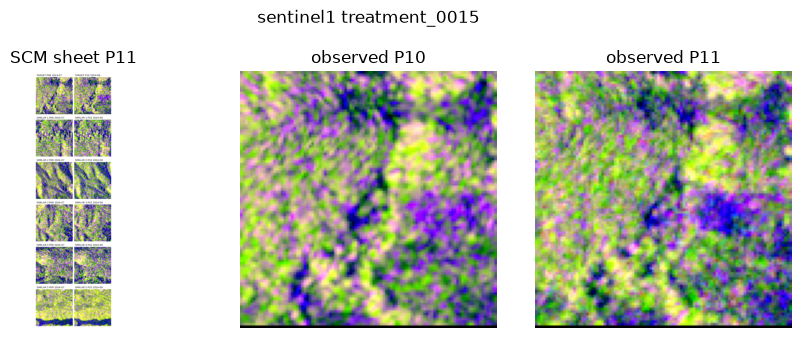

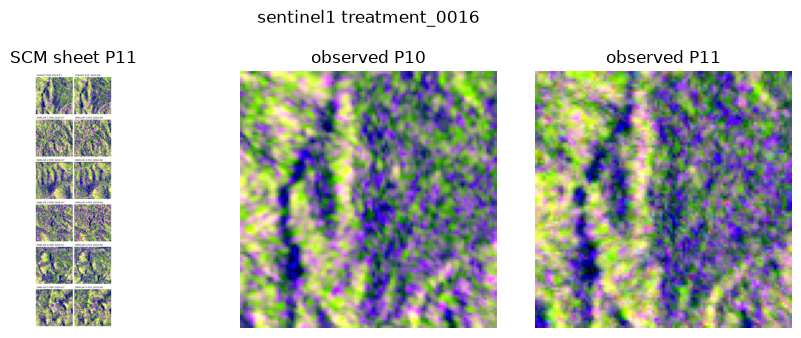

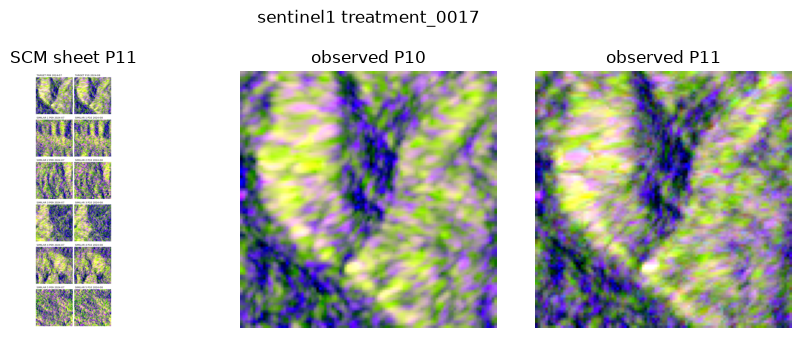

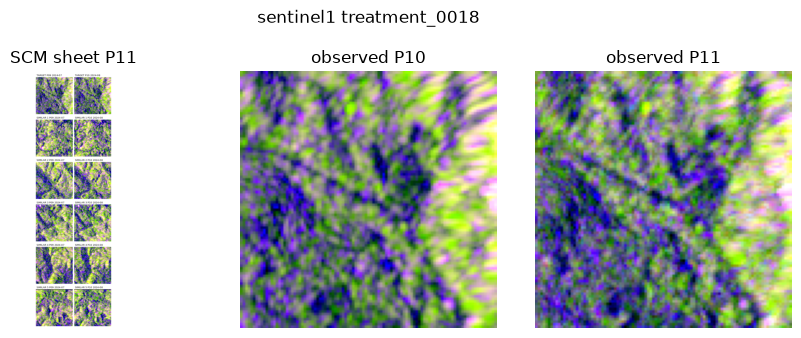

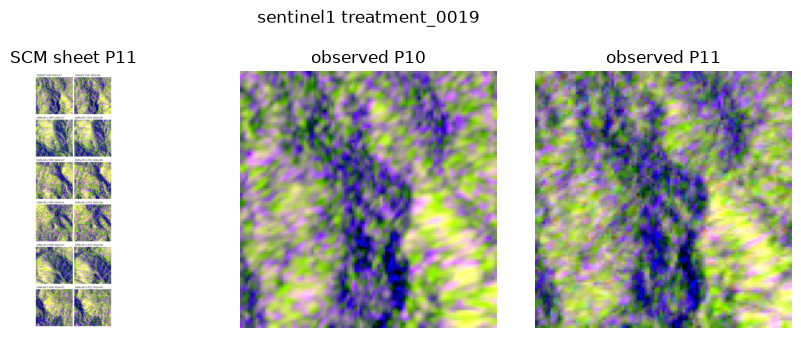

...

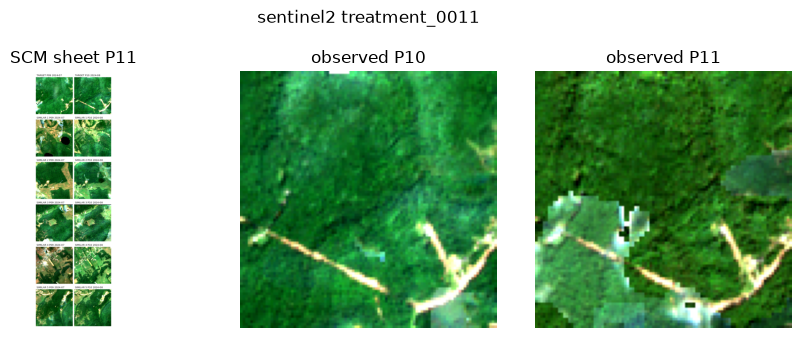

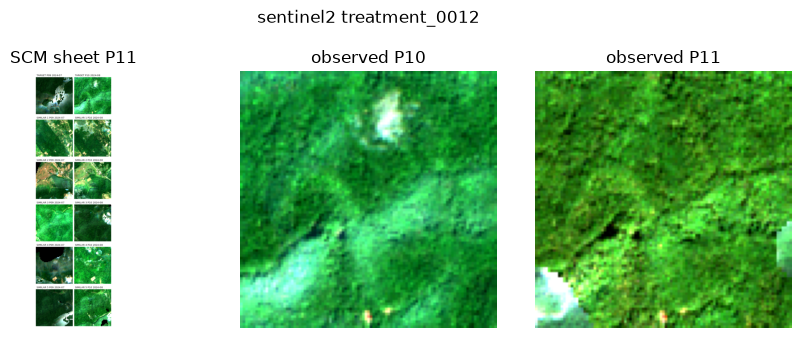

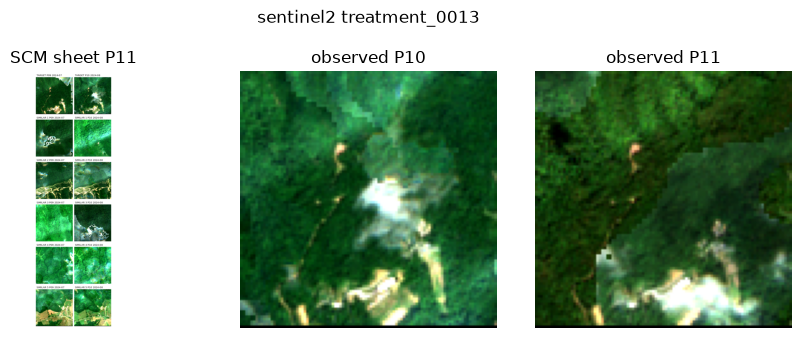

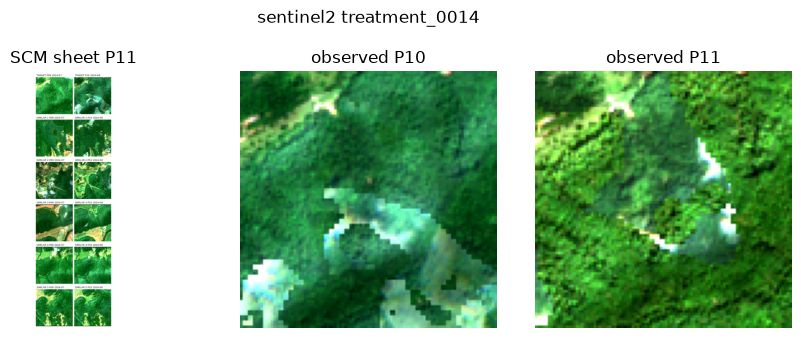

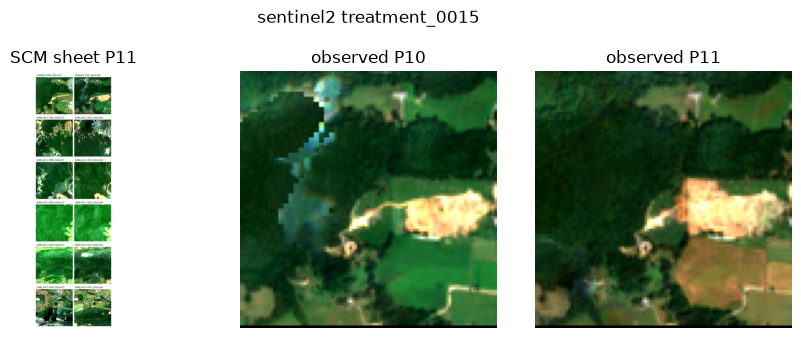

In [3]:
def show_site(sensor, site):
    sheet = Image.open(vg.VG / P[(P.sensor==sensor)&(P.target_site==site)&(P.arm=="scm")&(P.target=="P11")&(P.band==0)].sheet_image.iloc[0])
    obs = {t: Image.open(vg.PREVIEWS / f"{site}_{sensor}_{t}.png") for t in ("P10","P11")}
    gen = G[(G.sensor==sensor)&(G.target_site==site)&(G.ok==True)] if len(G) else G
    n = 3 + len(gen)
    fig, axes = plt.subplots(1, n, figsize=(3*n, 3.4))
    axes[0].imshow(sheet); axes[0].set_title("SCM sheet P11"); axes[0].axis("off")
    for ax, t in zip(axes[1:3], ("P10","P11")):
        ax.imshow(obs[t]); ax.set_title(f"observed {t}"); ax.axis("off")
    for ax, r in zip(axes[3:], gen.itertuples()):
        ax.imshow(Image.open(vg.VG / r.file)); ax.set_title(f"{r.model}/{r.layout}\n{r.arm} band{r.band} {r.target}", fontsize=8); ax.axis("off")
    fig.suptitle(f"{sensor} {site}"); plt.tight_layout(); plt.show()
for sensor in ("sentinel1", "sentinel2"):
    for site in sorted(P[P.sensor==sensor].target_site.unique()):
        show_site(sensor, site)